In [2]:
# import system libs
import os
import time
import shutil
import itertools
from PIL import Image
from pathlib import Path

# import data handling tools
import cv2
import numpy as np
import pandas as pd
import seaborn as sns
sns.set_style('darkgrid')
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import random

# import Deep learning Libraries
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Activation, Dropout, BatchNormalization,  GlobalAveragePooling2D
from tensorflow.keras.models import Model, load_model, Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from sklearn.metrics import confusion_matrix, classification_report , ConfusionMatrixDisplay
from sklearn.model_selection import train_test_split
from tensorflow.keras.optimizers import Adam, Adamax
from tensorflow.keras import regularizers
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.metrics import categorical_crossentropy
from tensorflow.keras.applications import DenseNet201, EfficientNetB6
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint
from tensorflow.keras.applications.densenet import preprocess_input

# Ignore Warnings
import warnings
warnings.filterwarnings("ignore")

print ('modules loaded')

modules loaded


In [3]:
# Load train & validation set
train_dir = "/kaggle/input/skin-cancer/datatree/train"

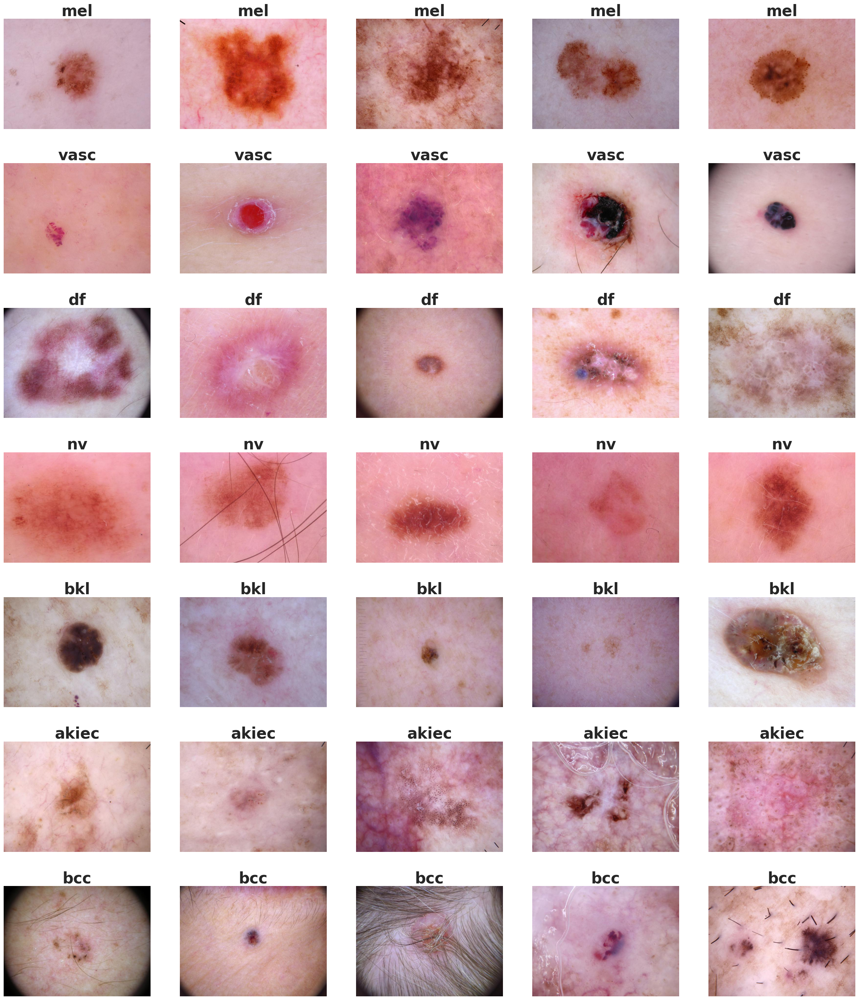

In [4]:
# Get the class names (folder names)
class_names = os.listdir(train_dir)

# Function to display samples of images from each class
def display_samples(train_dir, class_names, samples_per_class=5):
    plt.figure(figsize=(30, len(class_names) * 5))  # Increase figure size

    # Adjust spacing between subplots
    plt.subplots_adjust(hspace=0.2, wspace=0.2)  # Reduce spacing between images

    for i, class_name in enumerate(class_names):
        class_dir = os.path.join(train_dir, class_name)
        images = os.listdir(class_dir)

        for j in range(samples_per_class):
            img_path = os.path.join(class_dir, random.choice(images))
            img = mpimg.imread(img_path)
            plt.subplot(len(class_names), samples_per_class, i * samples_per_class + j + 1)
            plt.imshow(img)
            plt.title(class_name, fontweight='bold', fontsize=30)  # Increase font size
            plt.axis('off')

    plt.show()

# Display samples
display_samples(train_dir, class_names)

In [5]:
# Function to count the total number of images in the dataset
def count_images(train_dir, class_names):
    total_images = 0
    for class_name in class_names:
        class_dir = os.path.join(train_dir, class_name)
        num_images = len(os.listdir(class_dir))
        print(f"Class '{class_name}' contains____ {num_images} ____images.")
        total_images += num_images
    print(f"\nTotal number of images in the dataset: {total_images}")

# Count and print the number of images
count_images(train_dir, class_names)

Class 'mel' contains____ 890 ____images.
Class 'vasc' contains____ 111 ____images.
Class 'df' contains____ 91 ____images.
Class 'nv' contains____ 5362 ____images.
Class 'bkl' contains____ 877 ____images.
Class 'akiec' contains____ 260 ____images.
Class 'bcc' contains____ 409 ____images.

Total number of images in the dataset: 8000


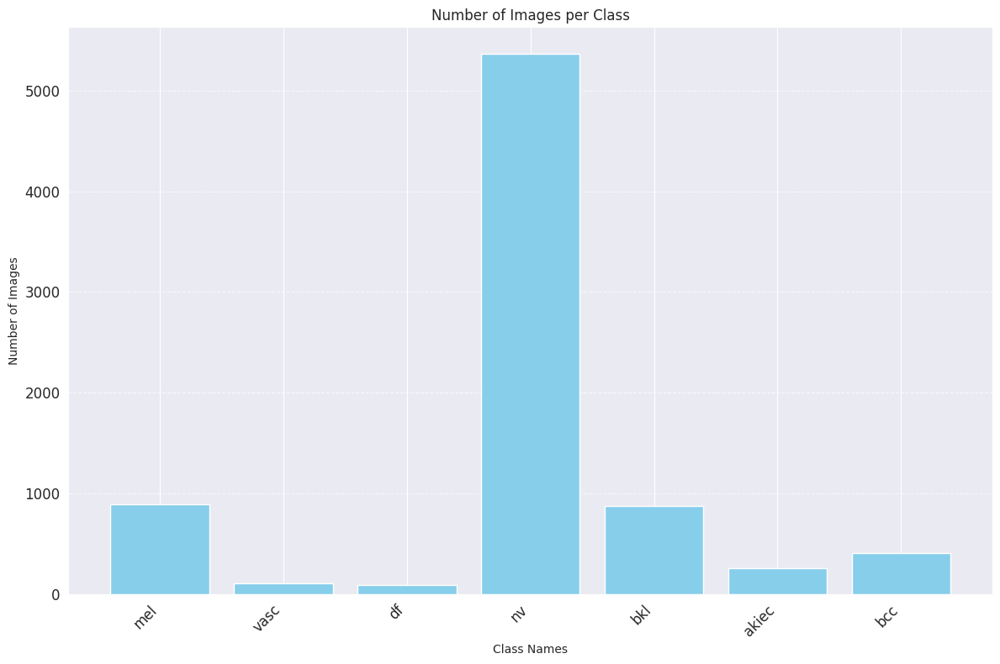

In [6]:
# Function to count the number of images in each class and plot a histogram
def plot_class_histogram(train_dir, class_names):
    class_counts = {}

    # Count the number of images in each class
    for class_name in class_names:
        class_dir = os.path.join(train_dir, class_name)
        num_images = len(os.listdir(class_dir))
        class_counts[class_name] = num_images

    # Plot the histogram
    plt.figure(figsize=(12, 8))
    plt.bar(class_counts.keys(), class_counts.values(), color='skyblue')
    plt.xlabel('Class Names')
    plt.ylabel('Number of Images')
    plt.title('Number of Images per Class')
    plt.xticks(rotation=45, ha='right', fontsize=12)
    plt.yticks(fontsize=12)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

# Plot the class histogram
plot_class_histogram(train_dir, class_names)

In [9]:
# Function to check and print the shape of images in the directory
def print_one_image_shape(directory):
    for class_name in os.listdir(directory):
        class_dir = os.path.join(directory, class_name)
        if os.path.isdir(class_dir):
            for img_name in os.listdir(class_dir):
                img_path = os.path.join(class_dir, img_name)
                with Image.open(img_path) as img:
                    width, height = img.size
                    channels = len(img.getbands())  # Get the number of channels
                    print(f"({width}, {height}, {channels})")
                    return  # Exit after printing the shape of one image

# Print the shape of images in the train directory
print_one_image_shape(train_dir)

(600, 450, 3)


In [10]:
# Function to check and print the distinct shapes of images in the directory
def print_distinct_image_shapes(directory):
    for class_name in os.listdir(directory):
        class_dir = os.path.join(directory, class_name)
        if os.path.isdir(class_dir):
            print(f"Class: {class_name}")
            distinct_shapes = set()
            for img_name in os.listdir(class_dir):
                img_path = os.path.join(class_dir, img_name)
                with Image.open(img_path) as img:
                    shape = (img.width, img.height, len(img.getbands()))  # Get shape as a tuple
                    distinct_shapes.add(shape)
            
            for shape in distinct_shapes:
                print(f"Distinct shape: {shape}")
            print("-" * 30)

# Print the distinct shapes of images in the train directory
print_distinct_image_shapes(train_dir)

Class: mel
Distinct shape: (600, 450, 3)
------------------------------
Class: vasc
Distinct shape: (600, 450, 3)
------------------------------
Class: df
Distinct shape: (600, 450, 3)
------------------------------
Class: nv
Distinct shape: (600, 450, 3)
------------------------------
Class: bkl
Distinct shape: (600, 450, 3)
------------------------------
Class: akiec
Distinct shape: (600, 450, 3)
------------------------------
Class: bcc
Distinct shape: (600, 450, 3)
------------------------------


In [11]:
def resize_images_to_uniform_shape(input_directory, output_directory, target_size=(224, 224)):
    # Create the output directory if it doesn't exist
    Path(output_directory).mkdir(parents=True, exist_ok=True)
    
    for class_name in os.listdir(input_directory):
        class_input_dir = os.path.join(input_directory, class_name)
        class_output_dir = os.path.join(output_directory, class_name)
        if os.path.isdir(class_input_dir):
            print(f"Processing class: {class_name}")
            Path(class_output_dir).mkdir(parents=True, exist_ok=True)  # Create class directory in output
            for img_name in os.listdir(class_input_dir):
                img_input_path = os.path.join(class_input_dir, img_name)
                img_output_path = os.path.join(class_output_dir, img_name)
                try:
                    with Image.open(img_input_path) as img:
                        img_resized = img.resize(target_size, Image.ANTIALIAS)
                        img_resized.save(img_output_path)
                except Exception as e:
                    print(f"Error processing {img_input_path}: {e}")
            print(f"Completed class: {class_name}")
            print("-" * 30)

# Directory containing the training images
train_dir = "/kaggle/input/skin-cancer/datatree/train"

# Directory to save the resized images
new_data_dir = "/kaggle/working/new_train_dir"

# Resize all images in the input directory to (224, 224) and save to output directory
resize_images_to_uniform_shape(train_dir, new_data_dir)

Processing class: mel
Completed class: mel
------------------------------
Processing class: vasc
Completed class: vasc
------------------------------
Processing class: df
Completed class: df
------------------------------
Processing class: nv
Completed class: nv
------------------------------
Processing class: bkl
Completed class: bkl
------------------------------
Processing class: akiec
Completed class: akiec
------------------------------
Processing class: bcc
Completed class: bcc
------------------------------


In [12]:
# Function to check and print the distinct shapes of images in the directory
def print_distinct_image_shapes(directory):
    for class_name in os.listdir(directory):
        class_dir = os.path.join(directory, class_name)
        if os.path.isdir(class_dir):
            print(f"Class: {class_name}")
            distinct_shapes = set()
            for img_name in os.listdir(class_dir):
                img_path = os.path.join(class_dir, img_name)
                with Image.open(img_path) as img:
                    shape = (img.width, img.height, len(img.getbands()))  # Get shape as a tuple
                    distinct_shapes.add(shape)
            
            for shape in distinct_shapes:
                print(f"Distinct shape: {shape}")
            print("-" * 30)

# Print the distinct shapes of images in the train directory
print_distinct_image_shapes(new_data_dir)

Class: df
Distinct shape: (224, 224, 3)
------------------------------
Class: bcc
Distinct shape: (224, 224, 3)
------------------------------
Class: vasc
Distinct shape: (224, 224, 3)
------------------------------
Class: akiec
Distinct shape: (224, 224, 3)
------------------------------
Class: mel
Distinct shape: (224, 224, 3)
------------------------------
Class: nv
Distinct shape: (224, 224, 3)
------------------------------
Class: bkl
Distinct shape: (224, 224, 3)
------------------------------


In [13]:
# Paths to your data
# Directory to save the resized images
new_data_dir = "/kaggle/working/new_train_dir"
class_names = ['mel', 'nv', 'df', 'bkl', 'akiec','vasc', 'bcc']

# Highest number of samples in any class
max_samples = 5362

# Image data generator for augmentation
datagen = ImageDataGenerator(
    rescale=1.0/255.0,
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True,
    fill_mode='nearest'
)

In [15]:
# Function to balancing images
def augment_images(class_dir, target_count):
    images = os.listdir(class_dir)
    current_count = len(images)
    while current_count < target_count:
        for img_name in images:
            img_path = os.path.join(class_dir, img_name)
            img = load_img(img_path)
            x = img_to_array(img)
            x = np.expand_dims(x, axis=0)
            i = 0
            for batch in datagen.flow(x, batch_size=1, save_to_dir=class_dir, save_prefix='aug', save_format='jpeg'):
                i += 1
                current_count += 1
                if current_count >= target_count:
                    break
            if current_count >= target_count:
                break

# Augment each class
for class_name in class_names:
    class_dir = os.path.join(new_data_dir, class_name)
    augment_images(class_dir, max_samples)

print("Data Balancing Done!")

Data Balancing Done!


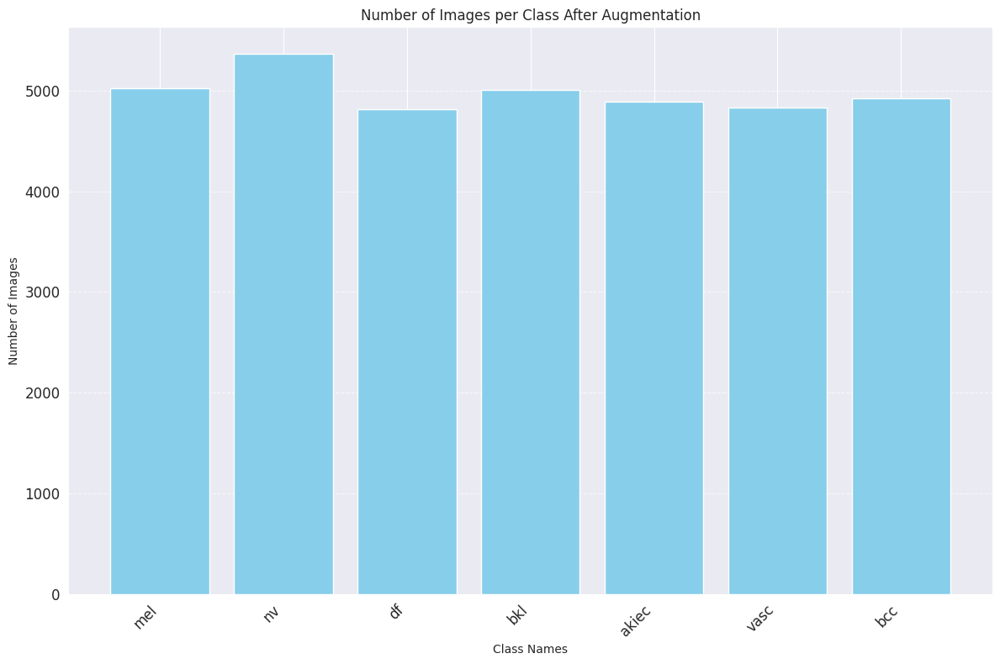

In [16]:
# Function to count the number of images in each class and plot a histogram
def plot_class_histogram(new_data_dir, class_names):
    class_counts = {}

    # Count the number of images in each class
    for class_name in class_names:
        class_dir = os.path.join(new_data_dir, class_name)
        num_images = len(os.listdir(class_dir))
        class_counts[class_name] = num_images

    # Plot the histogram
    plt.figure(figsize=(12, 8))
    plt.bar(class_counts.keys(), class_counts.values(), color='skyblue')
    plt.xlabel('Class Names')
    plt.ylabel('Number of Images')
    plt.title('Number of Images per Class After Augmentation')
    plt.xticks(rotation=45, ha='right', fontsize=12)
    plt.yticks(fontsize=12)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

# Plot the class histogram
plot_class_histogram(new_data_dir, class_names)

In [17]:
# Function to count the total number of images in the dataset
def count_images(new_data_dir, class_names):
    total_images = 0
    for class_name in class_names:
        class_dir = os.path.join(new_data_dir, class_name)
        num_images = len(os.listdir(class_dir))
        print(f"Class '{class_name}' contains____ {num_images} ____images.")
        total_images += num_images
    print(f"\nTotal number of images in the dataset: {total_images}")

# Count and print the number of images
count_images(new_data_dir, class_names)

Class 'mel' contains____ 5026 ____images.
Class 'nv' contains____ 5362 ____images.
Class 'df' contains____ 4817 ____images.
Class 'bkl' contains____ 5005 ____images.
Class 'akiec' contains____ 4894 ____images.
Class 'vasc' contains____ 4834 ____images.
Class 'bcc' contains____ 4921 ____images.

Total number of images in the dataset: 34859


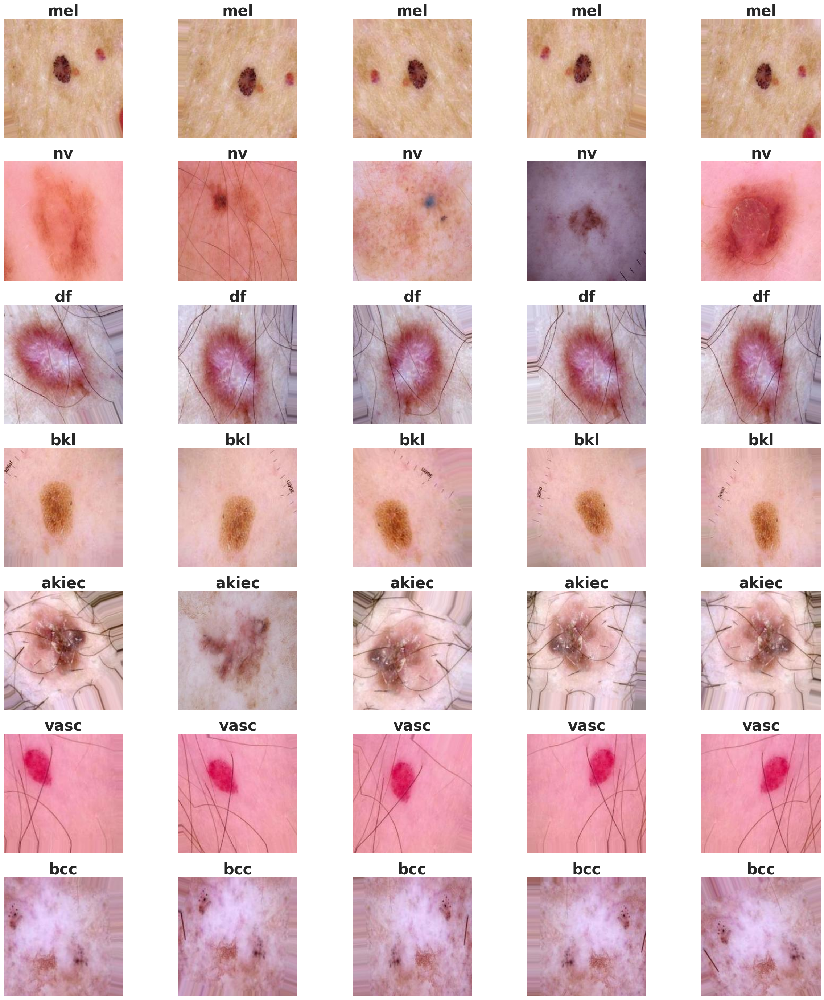

In [18]:
# Function to display samples of images from each class
def display_samples(new_data_dir, class_names, samples_per_class=5):
    plt.figure(figsize=(30, len(class_names) * 5))  # Increase figure size

    # Adjust spacing between subplots
    plt.subplots_adjust(hspace=0.2, wspace=0.2)  # Reduce spacing between images

    for i, class_name in enumerate(class_names):
        class_dir = os.path.join(new_data_dir, class_name)
        images = os.listdir(class_dir)

        for j in range(samples_per_class):
            img_path = os.path.join(class_dir, random.choice(images))
            img = mpimg.imread(img_path)
            plt.subplot(len(class_names), samples_per_class, i * samples_per_class + j + 1)
            plt.imshow(img)
            plt.title(class_name, fontweight='bold', fontsize=30)  # Increase font size
            plt.axis('off')

    plt.show()

# Display samples
display_samples(new_data_dir, class_names)

In [19]:
# Function to load images and convert them to numpy arrays
def load_images_and_labels(directory, target_size=(224, 224)):
    images = []
    labels = []
    class_names = os.listdir(directory)
    class_indices = {class_name: i for i, class_name in enumerate(class_names)}
    
    for class_name in class_names:
        class_dir = os.path.join(directory, class_name)
        if os.path.isdir(class_dir):
            for img_name in os.listdir(class_dir):
                img_path = os.path.join(class_dir, img_name)
                try:
                    with Image.open(img_path) as img:
                        img = img.convert('RGB')  # Ensure all images are in RGB
                        img_resized = img.resize(target_size, Image.ANTIALIAS)
                        img_array = np.array(img_resized)
                        images.append(img_array)
                        labels.append(class_indices[class_name])
                except Exception as e:
                    print(f"Error processing {img_path}: {e}")

    return np.array(images), np.array(labels), class_names

In [20]:
# Define your dataset directory
new_data_dir = "/kaggle/working/new_train_dir"

# Load images and labels
images, labels, class_names = load_images_and_labels(new_data_dir)
print(f"Loaded {len(images)} images with {len(labels)} labels.")

Loaded 34859 images with 34859 labels.


In [21]:
# Ensure labels are in a single dimension (flattened)
labels = np.array(labels).flatten()

In [22]:
# Step 1: Split the data into training and temporary sets
X_train, X_temp, y_train, y_temp = train_test_split(images, labels, test_size=0.3, random_state=42, stratify=labels)

# Step 2: Split the temporary set into validation and test sets
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42, stratify=y_temp)


# Check the sizes of the splits to ensure correctness
print(f'Training set size: {len(X_train)}')
print(f'Validation set size: {len(X_val)}')
print(f'Test set size: {len(X_test)}')

Training set size: 24401
Validation set size: 5229
Test set size: 5229


In [23]:
# Print the shapes of the datasets
print(f"Shape of X_train: {X_train.shape}")
print(f"Shape of X_val: {X_val.shape}")
print(f"Shape of X_test: {X_test.shape}")
print(f"Shape of y_train: {y_train.shape}")
print(f"Shape of y_val: {y_val.shape}")
print(f"Shape of y_test: {y_test.shape}")

Shape of X_train: (24401, 224, 224, 3)
Shape of X_val: (5229, 224, 224, 3)
Shape of X_test: (5229, 224, 224, 3)
Shape of y_train: (24401,)
Shape of y_val: (5229,)
Shape of y_test: (5229,)


In [24]:
# Verify the number of samples in each set
print(f"Training set: {len(X_train)} samples")
print(f"Validation set: {len(X_val)} samples")
print(f"Testing set: {len(X_test)} samples")

Training set: 24401 samples
Validation set: 5229 samples
Testing set: 5229 samples


In [25]:
# Convert labels to one-hot encoding
num_classes = len(class_names)
y_train = to_categorical(y_train, num_classes)
y_val = to_categorical(y_val, num_classes)
y_test = to_categorical(y_test, num_classes)

# Check the shapes to ensure correctness
print(f'Shape of X_train: {X_train.shape}')
print(f'Shape of X_val: {X_val.shape}')
print(f'Shape of X_test: {X_test.shape}')
print(f'Shape of y_train: {y_train.shape}')
print(f'Shape of y_val: {y_val.shape}')
print(f'Shape of y_test: {y_test.shape}')

Shape of X_train: (24401, 224, 224, 3)
Shape of X_val: (5229, 224, 224, 3)
Shape of X_test: (5229, 224, 224, 3)
Shape of y_train: (24401, 7)
Shape of y_val: (5229, 7)
Shape of y_test: (5229, 7)


In [26]:
y_train

array([[0., 0., 1., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 1., 0., 0.],
       ...,
       [0., 0., 1., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       [0., 0., 1., ..., 0., 0., 0.]])

In [27]:
y_val

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       [0., 0., 1., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 1., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.]])

In [28]:
y_test

array([[0., 1., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 1.]])

***Building The DenseNet121 Model***

In [29]:
conv_base = EfficientNetB6(
    weights='imagenet',
    include_top = False,
    input_shape=(224,224,3),
    pooling='avg'
)

165234480/165234480 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


In [30]:
"""
WHY FALSE ?

- Setting conv_base.trainable = False freezes the weights of the pre-trained DenseNet121 model.
- This is done to prevent the weights from being updated during the training of the custom classification head.
- Freezing the pre-trained weights helps in utilizing the learned features from the ImageNet dataset without altering them.
- It also reduces the computational cost and training time, as only the weights of the custom classification head will be trained.
"""

conv_base.trainable = False

In [ ]:
""""from tensorflow.keras.utils import plot_model

# Save the model architecture as an image
plot_model(conv_base, to_file='EfficientNetB7.png', show_shapes=True)

In [ ]:
""""# Summary of the pretrained model
conv_base.summary()

In [ ]:
from tensorflow.keras.layers import Input
from tensorflow.keras.regularizers import l2

# Bulid Model
model = keras.models.Sequential()

# Create Model Structure
model.add(keras.layers.Input(shape=[224, 224, 3]))
model.add(keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal'))
model.add(keras.layers.MaxPooling2D())
model.add(keras.layers.BatchNormalization())

model.add(keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal'))
model.add(keras.layers.MaxPooling2D())
model.add(keras.layers.BatchNormalization())

model.add(keras.layers.Flatten())

model.add(keras.layers.Dropout(rate=0.5))

model.add(keras.layers.Dense(units=128, activation='relu', kernel_initializer='he_normal'))
model.add(keras.layers.BatchNormalization())

model.add(keras.layers.Dense(units=64, activation='relu', kernel_initializer='he_normal'))
model.add(keras.layers.BatchNormalization())

model.add(keras.layers.Dense(units=7, activation='softmax', kernel_initializer='glorot_uniform', name='classifier'))

model.compile(Adamax(learning_rate=0.001), 
              loss='categorical_crossentropy', 
              metrics=['accuracy'])

# Callbacks for better training
callbacks = [
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, min_lr=1e-7, verbose=1),
    EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, verbose=1),
    ModelCheckpoint('best_model.keras', monitor='val_loss', save_best_only=True)
]

In [32]:
# Sequential Model
model = Sequential()
model.add(conv_base)
model.add(Flatten())  # Flatten the output of the conv base
model.add(BatchNormalization())
model.add(Dense(7, activation='softmax'))

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Callbacks for better training
callbacks = [
    ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, min_lr=1e-7),
    EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, verbose=1),
    ModelCheckpoint('best_model.keras', monitor='val_loss', save_best_only=True)  # Updated extension to .keras
]

In [ ]:
""""from tensorflow.keras.layers import Input

# Build the model
model = Sequential([
    Input(shape=(224, 224, 3)),
    conv_base,
    GlobalAveragePooling2D(),
    BatchNormalization(),
    Dropout(0.5),
    Dense(128, activation='relu', kernel_regularizer=l2(0.01)),
    BatchNormalization(),
    Dropout(0.5),
    Dense(7, activation='softmax', kernel_regularizer=l2(0.01))
])

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])


# Callbacks for better training
callbacks = [
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, min_lr=1e-7, verbose=1),
    EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, verbose=1),
    ModelCheckpoint('best_model.keras', monitor='val_loss', save_best_only=True)
]

# Model Summary
model.summary()

In [33]:
# Train the model 
history = model.fit(
    X_train, y_train,
    epochs=100,  # Increase the number of epochs
    validation_data=(X_val, y_val),
    batch_size=64,
    callbacks=callbacks,
    verbose=1
)

Epoch 1/100


I0000 00:00:1717941497.859127     115 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
W0000 00:00:1717941497.994745     115 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


382/382 ━━━━━━━━━━━━━━━━━━━━ 0s 536ms/step - accuracy: 0.7438 - loss: 0.8268

W0000 00:00:1717941702.508326     115 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
W0000 00:00:1717941718.590562     115 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
W0000 00:00:1717941767.055195     115 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


382/382 ━━━━━━━━━━━━━━━━━━━━ 392s 712ms/step - accuracy: 0.7441 - loss: 0.8258 - val_accuracy: 0.9248 - val_loss: 0.2720 - learning_rate: 1.0000e-04
Epoch 2/100
382/382 ━━━━━━━━━━━━━━━━━━━━ 152s 397ms/step - accuracy: 0.9256 - loss: 0.2454 - val_accuracy: 0.9298 - val_loss: 0.2108 - learning_rate: 1.0000e-04
Epoch 3/100
382/382 ━━━━━━━━━━━━━━━━━━━━ 152s 398ms/step - accuracy: 0.9283 - loss: 0.2188 - val_accuracy: 0.9346 - val_loss: 0.1939 - learning_rate: 1.0000e-04
Epoch 4/100
382/382 ━━━━━━━━━━━━━━━━━━━━ 152s 397ms/step - accuracy: 0.9336 - loss: 0.1998 - val_accuracy: 0.9346 - val_loss: 0.1846 - learning_rate: 1.0000e-04
Epoch 5/100
382/382 ━━━━━━━━━━━━━━━━━━━━ 152s 398ms/step - accuracy: 0.9346 - loss: 0.1895 - val_accuracy: 0.9356 - val_loss: 0.1783 - learning_rate: 1.0000e-04
Epoch 6/100
382/382 ━━━━━━━━━━━━━━━━━━━━ 152s 397ms/step - accuracy: 0.9342 - loss: 0.1838 - val_accuracy: 0.9363 - val_loss: 0.1752 - learning_rate: 1.0000e-04
Epoch 7/100
382/382 ━━━━━━━━━━━━━━━━━━━━ 152s 

In [34]:
# Evaluate the model
val_loss, val_acc = model.evaluate(X_val, y_val)

# Print the evaluation metrics
print(f"Validation Loss: {val_loss:.4f}")
print(f"Validation Accuracy: {val_acc*100:.2f}%")

  1/164 ━━━━━━━━━━━━━━━━━━━━ 50:56 19s/step - accuracy: 0.9375 - loss: 0.1076

W0000 00:00:1717945268.630465     115 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


164/164 ━━━━━━━━━━━━━━━━━━━━ 60s 252ms/step - accuracy: 0.9439 - loss: 0.1539
Validation Loss: 0.1541
Validation Accuracy: 94.55%


W0000 00:00:1717945309.779885     115 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


In [35]:
# Retrieve training and validation metrics from the history object
train_loss = history.history['loss'][-1]
train_acc = history.history['accuracy'][-1]
val_loss = history.history['val_loss'][-1]
val_acc = history.history['val_accuracy'][-1]

# Print the training and validation metrics
print(f"Training Loss: {train_loss:.4f}")
print(f"Training Accuracy: {train_acc*100:.2f}%")
print(f"Validation Loss: {val_loss:.4f}")
print(f"Validation Accuracy: {val_acc*100:.2f}%")

Training Loss: 0.1309
Training Accuracy: 95.14%
Validation Loss: 0.1545
Validation Accuracy: 94.55%


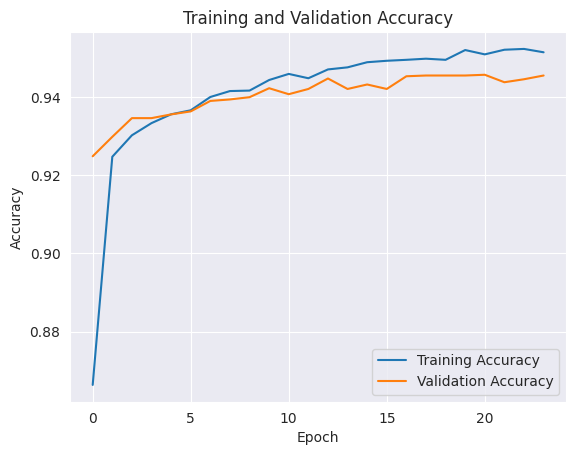

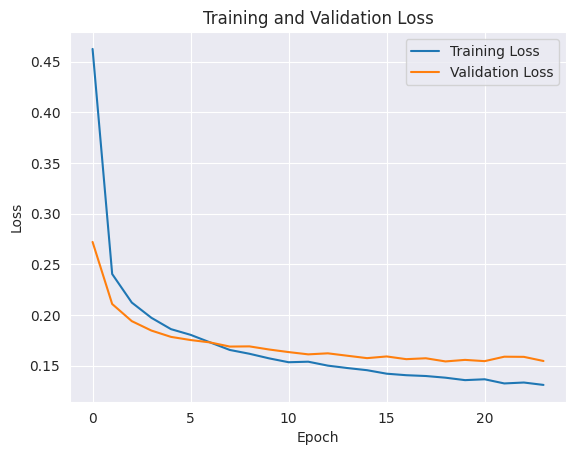

In [36]:
# Plot training and validation accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')
plt.show()

# Plot training and validation loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.show()

In [37]:
# Predict the labels for the validation set
y_val_pred = model.predict(X_val)
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_val_true_classes = np.argmax(y_val, axis=1)

  2/164 ━━━━━━━━━━━━━━━━━━━━ 23s 143ms/step

W0000 00:00:1717945364.992872     115 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


164/164 ━━━━━━━━━━━━━━━━━━━━ 54s 245ms/step


W0000 00:00:1717945404.994625     115 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


In [38]:
# Print classification report
print("Classification Report:")
print(classification_report(y_val_true_classes, y_val_pred_classes, target_names=class_names))

Classification Report:
              precision    recall  f1-score   support

          df       1.00      0.99      0.99       722
         bcc       0.97      0.95      0.96       738
        vasc       0.99      0.99      0.99       725
       akiec       0.98      0.97      0.97       734
         mel       0.95      0.88      0.91       754
          nv       0.85      0.94      0.89       805
         bkl       0.90      0.92      0.91       751

    accuracy                           0.95      5229
   macro avg       0.95      0.95      0.95      5229
weighted avg       0.95      0.95      0.95      5229



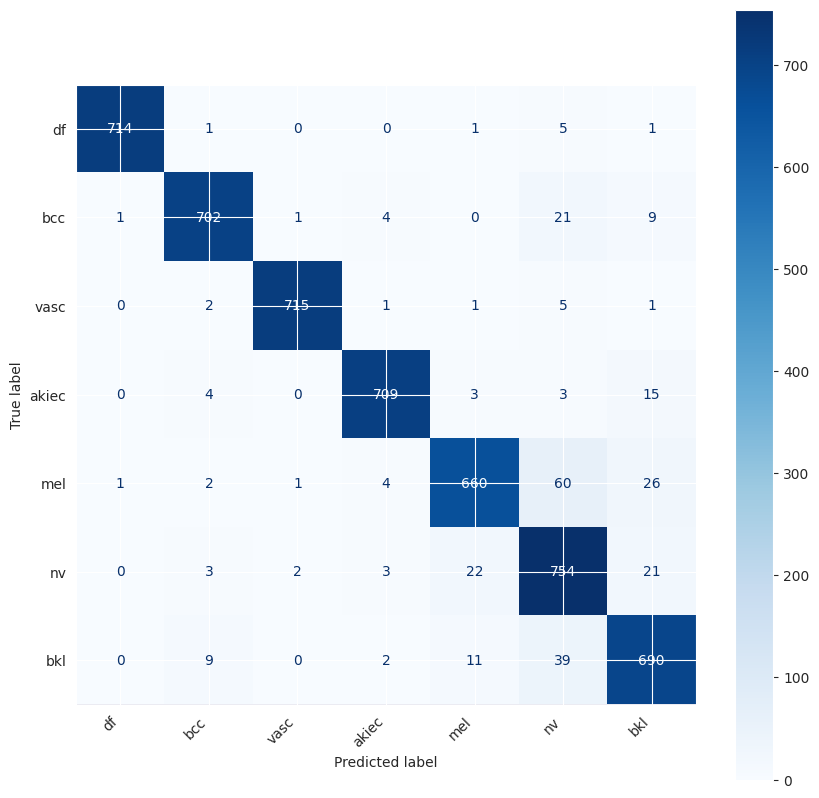

In [39]:
# Compute the confusion matrix
cm = confusion_matrix(y_val_true_classes, y_val_pred_classes)

# Display the confusion matrix
fig, ax = plt.subplots(figsize=(10, 10))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
disp.plot(cmap=plt.cm.Blues, ax=ax)
plt.xticks(rotation=45, ha='right')
plt.show()

In [40]:
# Save the model
model.save('EfficientNetB6_model.keras')

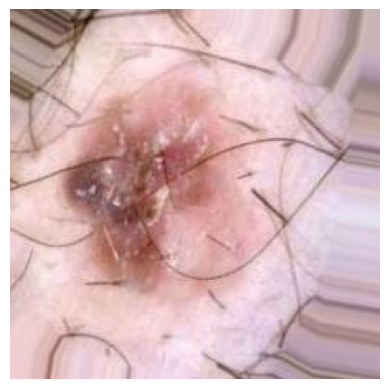

Image 1
Actual class: akiec
Predicted class: akiec
---


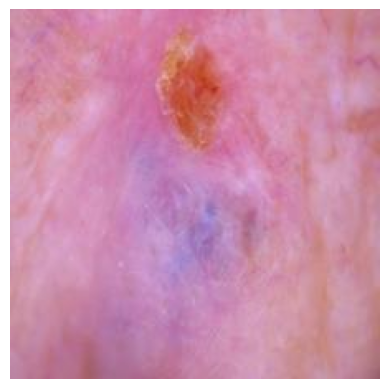

Image 2
Actual class: bcc
Predicted class: bkl
---


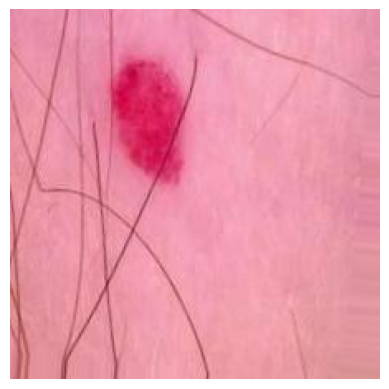

Image 3
Actual class: vasc
Predicted class: vasc
---


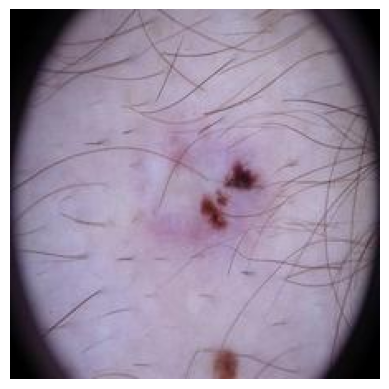

Image 5
Actual class: nv
Predicted class: nv
---


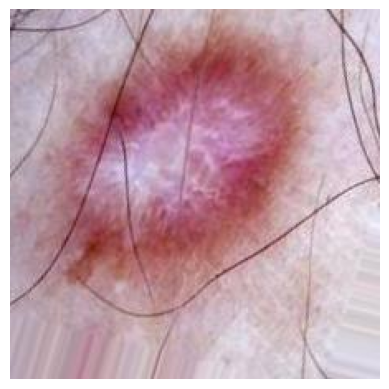

Image 13
Actual class: df
Predicted class: df
---


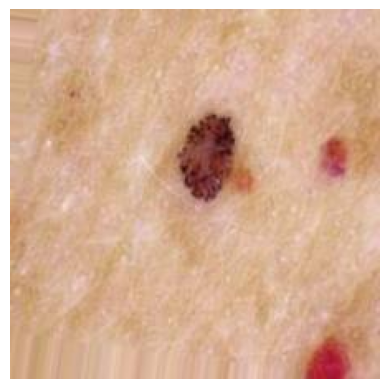

Image 15
Actual class: mel
Predicted class: mel
---


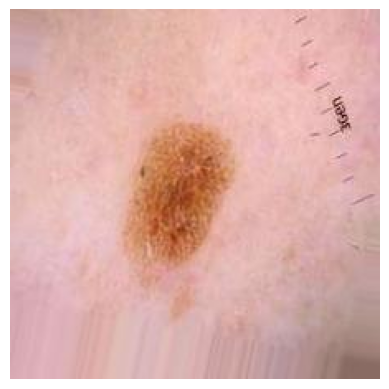

Image 24
Actual class: bkl
Predicted class: bkl
---


In [48]:
# Load the trained model
model = tf.keras.models.load_model('/kaggle/working/EfficientNetB6_model.keras')

# Define disease labels
cancers_labels = ['df', 'bcc', 'vasc', 'akiec', 'mel', 'nv', 'bkl']

# Track which classes we have already displayed
displayed_classes = set()

# Iterate through the validation set and display one sample from each class
for i in range(len(X_val)):
    actual_class_idx = y_val_true_classes[i]
    if actual_class_idx not in displayed_classes:
        displayed_classes.add(actual_class_idx)
        
        # Display the image
        plt.imshow(X_val[i])
        plt.axis('off')
        plt.show()

        # Map predicted label to class name
        predicted_class = cancers_labels[y_val_pred_classes[i]]

        # Map actual label to class name
        actual_class = cancers_labels[actual_class_idx]

        # Print actual and predicted classes
        print(f"Image {i+1}")
        print("Actual class:", actual_class)
        print("Predicted class:", predicted_class)
        print('-'*20)

    # Stop once we have displayed one sample from each class
    if len(displayed_classes) == len(cancers_labels):
        break

164/164 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step


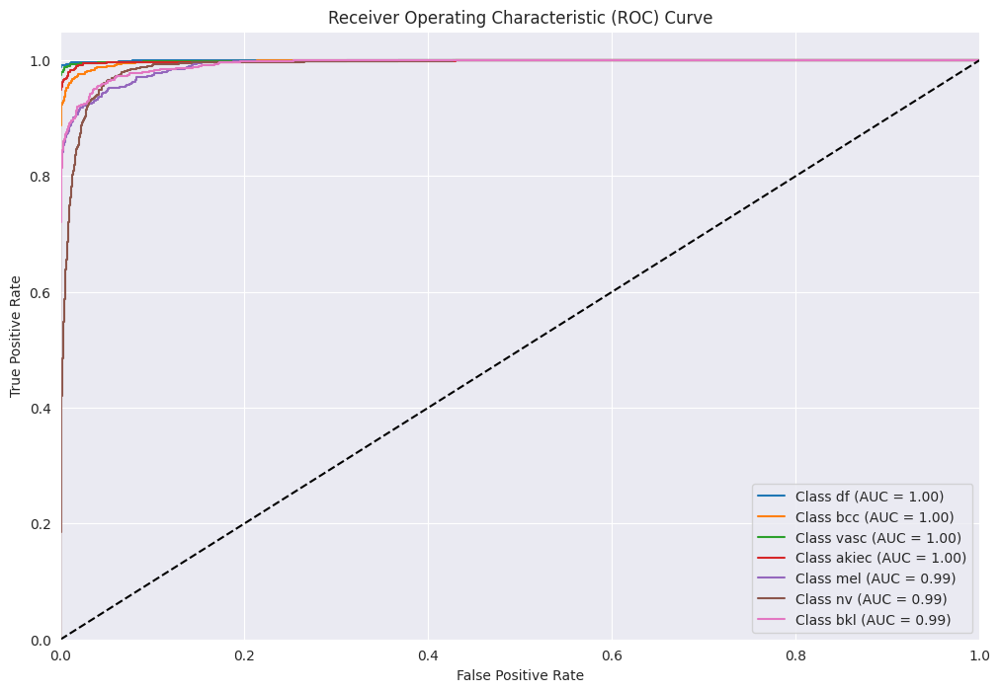

In [50]:
from sklearn.metrics import roc_curve, auc

# Define class names (make sure these match your classes)
class_names = ['df', 'bcc', 'vasc', 'akiec', 'mel', 'nv', 'bkl']

# Predict probabilities for the validation set
y_pred_proba = model.predict(X_val)

# Ensure y_val is one-hot encoded
if y_val.ndim == 1 or y_val.shape[1] == 1:
    y_val = tf.keras.utils.to_categorical(y_val, num_classes=len(class_names))

# Calculate the ROC curve and AUC for each class
fpr = {}
tpr = {}
roc_auc = {}

for i in range(len(class_names)):
    fpr[i], tpr[i], _ = roc_curve(y_val[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot the ROC curve for each class
plt.figure(figsize=(12, 8))
for i in range(len(class_names)):
    plt.plot(fpr[i], tpr[i], label=f'Class {class_names[i]} (AUC = {roc_auc[i]:.2f})')
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()